In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
from library import utils, config

In [2]:
!ls

README.md
draft 7.1 laptop analyze neumann simulations .ipynb
draft7 identifying avalanches in 50 traders old simulation.ipynb
fbm
forsiewann
hurst_step_001
hurst_step_01
library
libraryGPU
libraryMP
main.py
maingpu.py
mainmp.py
notebooks
papers
portfolio_networks
results
temp_results
traderIDs_test_nopricechange.pkl


In [3]:
with open('./results/7-9/traderIDs_500_1000_60_new2threshold.pkl', 'rb') as f:
    traderIDs = pickle.load(f)

Importing MATLAB


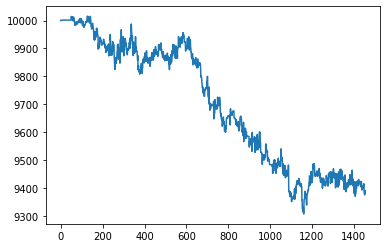

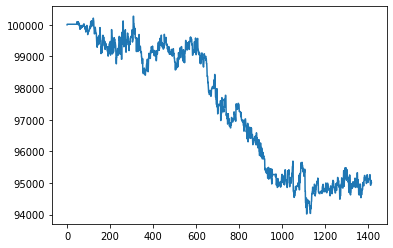

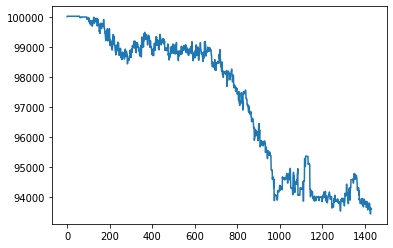

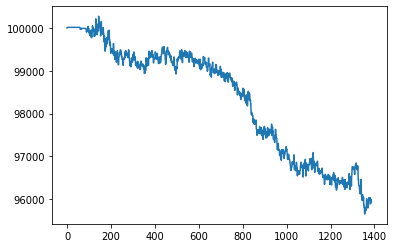

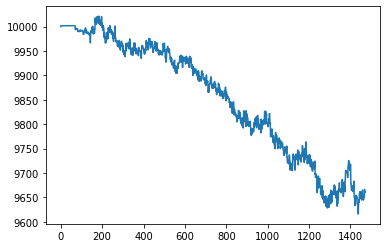

...

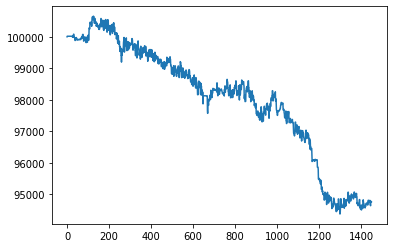

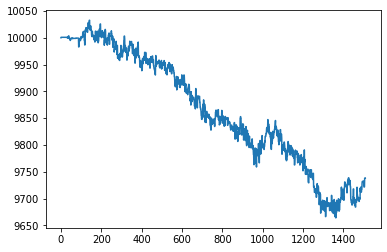

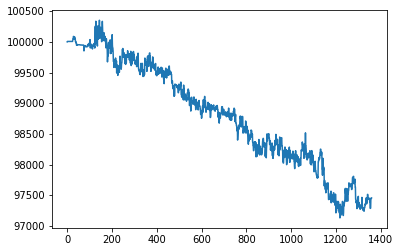

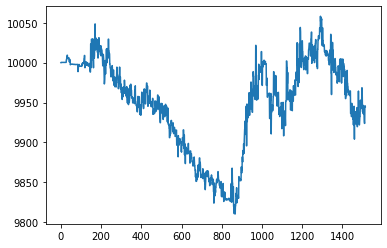

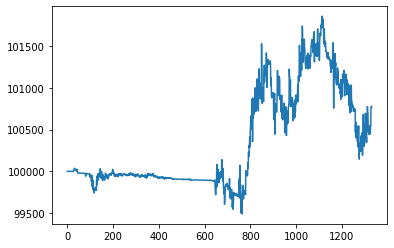

In [18]:
for portfID, portf in traderIDs.items():
#     plt.plot(np.arange(len(portf.sharpeReal)),portf.sharpeReal, color='blue')
#     plt.plot(np.arange(len(portf.sharpeOpt)),portf.sharpeOpt, color='red')
#     print(len(portf.sharpeReal))
    plt.plot(np.arange(len(portf.value)), portf.value)
    plt.show()

In [26]:
stockPool = np.load("./results/7-9/stockPool_500_1000_60_new2threshold.npy")
hurstPool = np.load("./results/7-9/hurstPool_500_1000_60_new2threshold.npy")
Ttransactions = pd.read_csv("./results/7-9/transactions_500_1000_60_new2threshold.csv")
TtotalOrders = pd.read_csv("./results/7-9/totalOrders_500_1000_60_new2threshold.csv")

In [114]:
# for i in range(len(stockPool)):
#     plt.plot(np.arange(len(stockPool[i])), stockPool[i])
#     plt.show()
#     plt.plot(np.arange(len(stockPool[i])), hurstPool[i])
#     plt.show()
def findStockOrderCascades(stockOrders, cascade, maxSep = 2):
    """
    inpurt filtered stockOrders table with time > _time
    works on stockOrder tables, returns value of stock moved
    FOR REAL CASCADES Aug1
    """
    if len(stockOrders) > 0 :
        ToS = stockOrders['time'].unique()
        sep = np.diff(ToS)
        #print(sep)
        #print(max(sep))
        keySep = np.where(sep>maxSep)[0]
        #print(keySep)
        if len(keySep)>0:
            endtime = ToS[keySep[0]] #end of this cascade
        else:
            endtime = ToS[-1]
        cascade = pd.concat([cascade,stockOrders[stockOrders['time']<=endtime]])
        return cascade
    else:
        print() 
    
def findPortfOrderCascades(TtotalOrders, portf, t0, maxSep = 1):
    """
    input TtotalOrders, the portfolio, and minimum time
    FOR REAL CASCADES Aug18
    """

    portfOrders = TtotalOrders[TtotalOrders['portfolio']==portf]
    portfOrders = portfOrders[portfOrders['time']>=t0]
    if len(portfOrders)>0:
        ToS = portfOrders['time'].unique()
        sep = np.diff(ToS)
        #print(sep)
        #print(max(sep))
        keySep = np.where(sep>maxSep)[0]
        #print(keySep)
        if len(keySep)>0:
            endtime = ToS[keySep[0]] #end of this cascade
        else:
            endtime = ToS[-1]
        portfCascade = portfOrders[portfOrders['time']<=endtime]
        return portfCascade
    else:
        return pd.DataFrame()
    
    

# Cascades

In [20]:
# Get stock overlap
holders = {}
for i in range(len(stockPool)):
    hold = []
    for name, portf in traderIDs.items():
        if i in portf.stocks:
            hold.append(name)
    holders[i] = hold

In [96]:
# 1. start with 1 portfolio's set of stocks 
# 2. look at all portoflios that also hold those stocks
# 3. add their cascades to the cascade and repeat
# 4. new seed portfolio would be trades of stocks that are not within the other cascades stock pool

cascades = {}
numCascade = 1
cascadeStocks = {}
cascadePortfs = {}
cascadeTime = {}
cascadeTf = {}
cascades = {}
for t in range(1000,1001):
    totalTimeOrders = TtotalOrders[TtotalOrders['time']==t]
    # seed with first portfolio
    seed = (totalTimeOrders.iloc[0]['portfolio'])
    cascadeStocks[0] = np.asarray(totalTimeOrders[totalTimeOrders['portfolio']==seed]['stock'])
    cascadePortfs[0] = np.asarray(seed)
    cascadeTime[0] = t
    cascadeStocks[numCascade] = np.array([])
    cascadePortfs[numCascade] = np.array([])
    unassigned = pd.DataFrame()
#     for row in range(len(totalTimeOrders)):
# #         print(totalTimeOrders.iloc[row]['portfolio'],totalTimeOrders.iloc[row]['stock'])
#         childPortf = totalTimeOrders.iloc[row]['portfolio']
#         childStock = totalTimeOrders.iloc[row]['stock']
#         assigned = False
#         for nCasc in range(numCascade):
            # ORIGINAL VERSION (STOCK PERSPECTIVE)
#             for stock in np.copy(cascadeStocks[nCasc]):
#                 if np.isin(childPortf,holders[stock]): # SEE IF THE STOCKS IN CHILDPORTF HAVE BEEN TRADED see if its in the seed casacde 
#                     assigned = True
# #                     print(childStock, "assigned | ", childPortf)
#                     if childStock not in cascadeStocks[nCasc]:
#                         cascadeStocks[nCasc] = np.append(cascadeStocks[nCasc], childStock)
#                         print(cascadeStocks)
#                     if childPortf not in cascadePortfs[nCasc]:
#                         cascadePortfs[nCasc] = np.append(cascadePortfs[nCasc], childPortf)
#                     break

            # NEW VERSION (PORTFOLIO PERSPECTIVE)
    for nCasc in range(numCascade):
        for childPortf in list(totalTimeOrders['portfolio'].unique()):
#             print(childPortf)
            if any(np.isin(cascadeStocks[nCasc],traderIDs[childPortf].stocks)):
                assigned = True
                for childStock in list(totalTimeOrders[totalTimeOrders['portfolio']==childPortf]['stock']):
                    if childStock not in cascadeStocks[nCasc]:
                        cascadeStocks[nCasc] = np.append(cascadeStocks[nCasc], childStock)

                if childPortf not in cascadePortfs[nCasc]:
                    cascadePortfs[nCasc] = np.append(cascadePortfs[nCasc], childPortf)
                
                    
        if assigned == False:
            print(traderIDs[childPortf].stocks, "not assigned | ", childPortf)
            unassigned = pd.concat([unassigned, totalTimeOrders[totalTimeOrders['portfolio']==childPortf]], axis=1, sort =True)
    
    unassigned = unassigned.transpose()
    print(cascadeStocks)
    # BEGIN NEW CASCADES seed with a single stock this time
    print(len(unassigned))
    while len(unassigned)>0:
        print("NUMCASC: ", numCascade)
        unassigned.reset_index(inplace=True)
        seedPortf = unassigned.iloc[0]['portfolio']
        print(seedPortf)
        cascadePortfs[numCascade] = np.append(cascadeStocks[numCascade], seedPortf)
        cascadeStocks[numCascade] = np.asarray(unassigned[unassigned['portfolio']==seedPortf]['stock'])
        cascadeTime[numCascade] = t
        print("unassigned: ", unassigned)
        toDrop = []
        for row in range(len(unassigned)):
    #         print(totalTimeOrders.iloc[row]['portfolio'],totalTimeOrders.iloc[row]['stock'])
            childPortf = unassigned.iloc[row]['portfolio']
            childStock = unassigned.iloc[row]['stock']
            assigned = False
            for nCasc in range(numCascade,numCascade+1):
                for stock in np.copy(cascadeStocks[nCasc]): 
                    if np.isin(childPortf,holders[stock]): # see if its in the seed casacde
                        toDrop.append(row)
                        if childStock not in cascadeStocks[nCasc]:
                            cascadeStocks[nCasc] = np.append(cascadeStocks[nCasc], childStock)
                        if childPortf not in cascadePortfs[nCasc]:
                            cascadePortfs[nCasc] = np.append(cascadePortfs[nCasc], childPortf)
                        break
        print("todrop: ", toDrop)
        unassigned.drop(toDrop, inplace=True)
        print("making new cascade")
        numCascade += 1
        cascadeStocks[numCascade] = np.array([])
        cascadePortfs[numCascade] = np.array([])
#     # copy orders dataframe     
#     for n, stocks in cascadeStocks.items():
#         if len(stocks) > 0:
#             totalCascade = pd.DataFrame()
#             for stock in stocks:
#                 stockOrders = TtotalOrders[TtotalOrders['time']>t]
#                 stockOrders = stockOrders[stockOrders['stock']==stock]
# #                 print("stockOrders: ",len(stockOrders))
#                 totalCascade = findStockOrderCascades(stockOrders, totalCascade, maxSep = 5)
#             cascades[n] = totalCascade
# #             print("totalCascade: ", len(totalCascade))
# #             print(totalCascade['time'].max())
#             cascadeTf[n] = totalCascade['time'].max()
# # at next time steps compare with existing seeds 

    
print(cascadeStocks)
print(cascadePortfs)
print(unassigned)
print(cascadeTime)

{0: array([ 2,  3,  4,  6,  1, 10, 11, 13, 14, 15, 73, 35, 33, 88, 83, 77, 92,
       94, 72, 99, 19, 60, 24, 32, 45, 74, 43, 78, 86, 18, 55, 59, 56, 36,
       53, 51, 50, 30, 89, 75, 40, 90, 20, 68, 41, 62, 66, 91, 31, 57, 95,
       85, 54, 28, 98]), 1: array([], dtype=float64)}
0
{0: array([ 2,  3,  4,  6,  1, 10, 11, 13, 14, 15, 73, 35, 33, 88, 83, 77, 92,
       94, 72, 99, 19, 60, 24, 32, 45, 74, 43, 78, 86, 18, 55, 59, 56, 36,
       53, 51, 50, 30, 89, 75, 40, 90, 20, 68, 41, 62, 66, 91, 31, 57, 95,
       85, 54, 28, 98]), 1: array([], dtype=float64)}
{0: array(['brkal', 'nvyct', 'zrdya', 'ocrgl', 'yxpbk', 'cajgv', 'zpokh',
       'uiwvh', 'haksx', 'mqzhn', 'fnqbi', 'efvip', 'nbtjh', 'vrfma',
       'gbtls', 'opgnf', 'jbkrf', 'coiqs', 'jwgmi', 'netrc', 'ckqav',
       'hkxrv', 'kfnsu', 'shryg', 'dhmyo', 'yerag', 'xnqaj', 'karzs',
       'tzmkx', 'xekgp', 'mnual', 'xgkva', 'djmha', 'uwbna', 'kqgtb',
       'pldiv', 'smlix', 'hneol', 'mrvkt', 'tfzsk', 'zawbc', 'ebjpk',
       '

In [73]:
combinedCascades = []
for t in range(1001,1985):
    totalTimeOrders = TtotalOrders[TtotalOrders['time']==t]
    unassigned = list(totalTimeOrders[totalTimeOrders['stock']!=seed]['stock'].unique())
    print(unassigned)
    while len(unassigned)>0:
#         print("Unassportf: ", unassportf)
        for ind, childStock in enumerate(np.copy(unassigned)):
            assigned = []
#             print(ind, childStock, unassportf[ind])
            for n in range(numCascade):
                for stock in np.copy(cascadeStocks[n]):
    #                 print("comparing: ", stock)
                    if any(np.isin(holders[childStock], holders[stock])) and t <= cascadeTf[n]: # if stocks have any overlap at all 
    #                     print('unassigned: ',unassigned)
                        assigned.append(n)
                        if childStock not in cascadeStocks[n]: # append orders dataframe
                            print('cascade: ', n, 'stock: ', stock,' child: ', childStock)
                            cascadeStocks[n] = np.append(cascadeStocks[n], childStock)
                            stockOrders = TtotalOrders[TtotalOrders['time']>t]
                            stockOrders = stockOrders[stockOrders['stock']==childStock]
                            cascades[n] = findStockOrderCascades(stockOrders,cascades[n],maxSep=1)
                            cascadeTf[n] = cascades[n]['time'].max() 
                        break # now go through next cascade
            if len(assigned) >= 1:
                unassigned.remove(childStock)
            if len(assigned) > 1:
                combinedCascades.append(assigned)
            elif len(assigned) == 0:
                totalCascade = pd.DataFrame()
                print("making new cascade")
                cascadeStocks[numCascade] = np.array([childStock])
                stockOrders = TtotalOrders[TtotalOrders['time']>t]
                stockOrders = stockOrders[stockOrders['stock']==childStock]
                totalCascade = findStockOrderCascades(stockOrders,totalCascade,maxSep=1)
                cascades[numCascade] = totalCascade
                cascadeTf[numCascade] = cascades[numCascade]['time'].max() 
                numCascade += 1
                cascadeStocks[numCascade] = np.array([])

    
print(cascadeStocks)
print(unassigned)
print(cascadeTime)
print(cascadeTf)

,index,Unnamed: 0,order,portfolio,stock,time


# Just run cascading until protoflio remains silent

# Seed with each portfolio and then go?

brkal brkal
nvyct nvyct
zrdya zrdya
ocrgl ocrgl
yxpbk yxpbk
cajgv cajgv
zpokh zpokh
uiwvh uiwvh
haksx haksx
mqzhn mqzhn
fnqbi fnqbi
efvip efvip
nbtjh nbtjh
vrfma vrfma
gbtls gbtls
opgnf opgnf
jbkrf jbkrf
coiqs coiqs
jwgmi jwgmi
netrc netrc
ckqav ckqav
hkxrv hkxrv
kfnsu kfnsu
shryg shryg
dhmyo dhmyo
yerag yerag
xnqaj xnqaj
karzs karzs
tzmkx tzmkx
xekgp xekgp
mnual mnual
xgkva xgkva
djmha djmha
uwbna uwbna
kqgtb kqgtb
pldiv pldiv
smlix smlix
hneol hneol
mrvkt mrvkt
tfzsk tfzsk
zawbc zawbc
ebjpk ebjpk
oqxsv oqxsv
fvdbq fvdbq
mvlse mvlse
bjufg bjufg
sjkxu sjkxu
jivqu jivqu
bjkzx bjkzx
jgiya jgiya
ehvzi ehvzi
bckge bckge
xakbs xakbs
eqsrw eqsrw
dunam dunam
cdajb cdajb
yqcou yqcou
agwcn agwcn
dytvw dytvw
jhmdu jhmdu
fzwbu fzwbu
mfpco mfpco
bxfrh bxfrh
lgimb lgimb
borzj borzj
kyoqu kyoqu
ebfyu ebfyu
qnwhb qnwhb
ahctd ahctd
bzmlc bzmlc
sbtyj sbtyj
xdavg xdavg
yxzfw yxzfw
tlhsa tlhsa
qbdxt qbdxt
srxvz srxvz
spafu spafu
izksl izksl
xzvhr xzvhr
lcjfx lcjfx
wfkgh wfkgh
jhdne jhdne
ubozp ubozp
afsm

In [104]:
a = TtotalOrders.copy()

In [106]:
b = a[:3]

In [107]:
b

,Unnamed: 0,time,portfolio,stock,order
0,2,993,brkal,2,-1.0
1,6,993,brkal,6,1.0
2,0,993,nvyct,1,-8.0


In [108]:
a

,Unnamed: 0,time,portfolio,stock,order
0,2,993,brkal,2,-1.0
1,6,993,brkal,6,1.0
2,0,993,nvyct,1,-8.0
3,1,993,nvyct,2,-18.0
4,2,993,nvyct,3,1.0
...,...,...,...,...,...
768915,4,1992,uadqv,45,3.0
768916,5,1992,uadqv,95,-11.0
768917,6,1992,uadqv,13,-17.0
768918,7,1992,uadqv,87,31.0


In [120]:
a = a[~a.isin(b)].dropna()
print(a)

        Unnamed: 0    time portfolio  stock  order
3              1.0   993.0     nvyct    2.0  -18.0
4              2.0   993.0     nvyct    3.0    1.0
5              3.0   993.0     nvyct    4.0    1.0
6              5.0   993.0     nvyct    6.0   -1.0
7              9.0   993.0     nvyct   10.0   12.0
...            ...     ...       ...    ...    ...
768915         4.0  1992.0     uadqv   45.0    3.0
768916         5.0  1992.0     uadqv   95.0  -11.0
768917         6.0  1992.0     uadqv   13.0  -17.0
768918         7.0  1992.0     uadqv   87.0   31.0
768919         9.0  1992.0     uadqv    3.0  -24.0

[768917 rows x 5 columns]


# New method remove rows

In [131]:
# 1. start with 1 portfolio's set of stocks 
# 2. look at all portoflios that also hold those stocks
# 3. add their cascades to the cascade and repeat
# 4. new seed portfolio would be trades of stocks that are not within the other cascades stock pool
TtotalOrders = pd.read_csv("./results/7-9/totalOrders_500_1000_60_new2threshold.csv")

cascades = {}
numCascade = 0
cascadeStocks = {}
cascadePortfs = {}
cascadeTime = {}
cascadeTf = {}
cascades = {}
while len(TtotalOrders) > 0:
#     totalTimeOrders = TtotalOrders[TtotalOrders['time']==t]
    # seed with first portfolio
    print("OG Orders left: ", len(TtotalOrders))
    seed = (TtotalOrders.iloc[0]['portfolio'])
    t0 = TtotalOrders.iloc[0]['time']
    seedCascade = findPortfOrderCascades(TtotalOrders, seed, t0)
    cascadeStocks[numCascade] = np.asarray(seedCascade['stock'])
    cascadePortfs[numCascade] = np.asarray(seed)
    cascadeTime[numCascade] = t0
    cascades[numCascade] = seedCascade
    assert len(seedCascade) > 0
    TtotalOrders = TtotalOrders[~TtotalOrders.isin(seedCascade)].dropna()
            # NEW VERSION (PORTFOLIO PERSPECTIVE)
    for childPortf in list(TtotalOrders['portfolio'].unique()):
        if any(np.isin(cascadeStocks[numCascade],traderIDs[childPortf].stocks)):
#             print("match: ", childPortf)
            if childPortf not in cascadePortfs[numCascade]:
                cascadePortfs[numCascade] = np.append(cascadePortfs[nCasc], childPortf)
                childPortfCascade = findPortfOrderCascades(TtotalOrders,childPortf,t0)
                cascades[numCascade] = pd.concat([cascades[numCascade],childPortfCascade])
                TtotalOrders = TtotalOrders[~TtotalOrders.isin(childPortfCascade)].dropna()
                for childStock in list(childPortfCascade['stock'].unique()):
                    if childStock not in cascadeStocks[nCasc]:
                        cascadeStocks[nCasc] = np.append(cascadeStocks[nCasc], childStock)
    print("Cascade length: ",len(cascades[numCascade]))
    print("New Orders left: ", len(TtotalOrders))
    cascadeTf[numCascade] = cascades[numCascade]['time'].max()
    print("making new cascade")
    numCascade += 1
    


    
print(cascadeStocks)
print(cascadePortfs)
print(unassigned)
print(cascadeTime)

OG Orders left:  768920
Cascade length:  4874
New Orders left:  764046
making new cascade
OG Orders left:  764046
Cascade length:  20
New Orders left:  764026
making new cascade
OG Orders left:  764026
Cascade length:  34
New Orders left:  763992
making new cascade
OG Orders left:  763992
Cascade length:  46
New Orders left:  763946
making new cascade
OG Orders left:  763946
Cascade length:  43
New Orders left:  763903
making new cascade
OG Orders left:  763903
Cascade length:  58
New Orders left:  763845
making new cascade
OG Orders left:  763845
Cascade length:  80
New Orders left:  763765
making new cascade
OG Orders left:  763765
Cascade length:  29
New Orders left:  763736
making new cascade
OG Orders left:  763736
Cascade length:  82
New Orders left:  763654
making new cascade
OG Orders left:  763654
Cascade length:  35
New Orders left:  763619
making new cascade
OG Orders left:  763619
Cascade length:  206
New Orders left:  763413
making new cascade
OG Orders left:  763413
Casca

Cascade length:  76
New Orders left:  757149
making new cascade
OG Orders left:  757149
Cascade length:  47
New Orders left:  757102
making new cascade
OG Orders left:  757102
Cascade length:  53
New Orders left:  757049
making new cascade
OG Orders left:  757049
Cascade length:  29
New Orders left:  757020
making new cascade
OG Orders left:  757020
Cascade length:  39
New Orders left:  756981
making new cascade
OG Orders left:  756981
Cascade length:  73
New Orders left:  756908
making new cascade
OG Orders left:  756908
Cascade length:  56
New Orders left:  756852
making new cascade
OG Orders left:  756852
Cascade length:  44
New Orders left:  756808
making new cascade
OG Orders left:  756808
Cascade length:  58
New Orders left:  756750
making new cascade
OG Orders left:  756750
Cascade length:  40
New Orders left:  756710
making new cascade
OG Orders left:  756710
Cascade length:  50
New Orders left:  756660
making new cascade
OG Orders left:  756660
Cascade length:  66
New Orders l

Cascade length:  19
New Orders left:  752180
making new cascade
OG Orders left:  752180
Cascade length:  83
New Orders left:  752097
making new cascade
OG Orders left:  752097
Cascade length:  53
New Orders left:  752044
making new cascade
OG Orders left:  752044
Cascade length:  118
New Orders left:  751926
making new cascade
OG Orders left:  751926
Cascade length:  61
New Orders left:  751865
making new cascade
OG Orders left:  751865
Cascade length:  112
New Orders left:  751753
making new cascade
OG Orders left:  751753
Cascade length:  71
New Orders left:  751682
making new cascade
OG Orders left:  751682
Cascade length:  98
New Orders left:  751584
making new cascade
OG Orders left:  751584
Cascade length:  49
New Orders left:  751535
making new cascade
OG Orders left:  751535
Cascade length:  96
New Orders left:  751439
making new cascade
OG Orders left:  751439
Cascade length:  55
New Orders left:  751384
making new cascade
OG Orders left:  751384
Cascade length:  64
New Orders

Cascade length:  9
New Orders left:  746158
making new cascade
OG Orders left:  746158
Cascade length:  60
New Orders left:  746098
making new cascade
OG Orders left:  746098
Cascade length:  94
New Orders left:  746004
making new cascade
OG Orders left:  746004
Cascade length:  27
New Orders left:  745977
making new cascade
OG Orders left:  745977
Cascade length:  75
New Orders left:  745902
making new cascade
OG Orders left:  745902
Cascade length:  66
New Orders left:  745836
making new cascade
OG Orders left:  745836
Cascade length:  102
New Orders left:  745734
making new cascade
OG Orders left:  745734
Cascade length:  78
New Orders left:  745656
making new cascade
OG Orders left:  745656
Cascade length:  80
New Orders left:  745576
making new cascade
OG Orders left:  745576
Cascade length:  33
New Orders left:  745543
making new cascade
OG Orders left:  745543
Cascade length:  42
New Orders left:  745501
making new cascade
OG Orders left:  745501
Cascade length:  26
New Orders l

Cascade length:  115
New Orders left:  738172
making new cascade
OG Orders left:  738172
Cascade length:  109
New Orders left:  738063
making new cascade
OG Orders left:  738063
Cascade length:  161
New Orders left:  737902
making new cascade
OG Orders left:  737902
Cascade length:  71
New Orders left:  737831
making new cascade
OG Orders left:  737831
Cascade length:  47
New Orders left:  737784
making new cascade
OG Orders left:  737784
Cascade length:  72
New Orders left:  737712
making new cascade
OG Orders left:  737712
Cascade length:  63
New Orders left:  737649
making new cascade
OG Orders left:  737649
Cascade length:  109
New Orders left:  737540
making new cascade
OG Orders left:  737540
Cascade length:  150
New Orders left:  737390
making new cascade
OG Orders left:  737390
Cascade length:  33
New Orders left:  737357
making new cascade
OG Orders left:  737357
Cascade length:  33
New Orders left:  737324
making new cascade
OG Orders left:  737324
Cascade length:  76
New Ord

KeyboardInterrupt: 

In [136]:
cascades[5]

,Unnamed: 0,time,portfolio,stock,order
52,1.0,993.0,ihnuo,66.0,1.0
53,3.0,993.0,ihnuo,68.0,1.0
54,7.0,993.0,ihnuo,72.0,3.0
55,8.0,993.0,ihnuo,73.0,5.0
56,9.0,993.0,ihnuo,74.0,-13.0
57,10.0,993.0,ihnuo,75.0,-8.0
1269,1.0,994.0,ihnuo,66.0,-8.0
1270,3.0,994.0,ihnuo,68.0,3.0
1271,7.0,994.0,ihnuo,72.0,4.0
1272,8.0,994.0,ihnuo,73.0,-5.0
